# Precluster

## Import packages

In [1]:
import scanpy as sc
import os,sys
import pandas as pd
import matplotlib.pylab as plt
%matplotlib inline
# from IPython.display import display, Markdown, Latex
import anndata
from ALLCools.plot import categorical_scatter
from pym3c.adata import MultiAdata,subset,generate_hic_adata
import warnings
warnings.filterwarnings("ignore")
sc.settings.set_figure_params(dpi=80)
import matplotlib as mpl
mpl.style.use('default')
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = 'Arial'

In [3]:
# Parameters
level = 2
parent_ct = "Splatter"
obs_cols = ["Region", "donor", "tech", "MajorType", "mCGFrac", "mCHFrac", "leiden"]
rootdir = "/home/x-wding2/Projects/BG/clustering/100kb"
metadata_path = "/home/x-wding2/Projects/BG/metadata/BG_metadata.tsv.gz"
mc_types = ["CGN", "CHN"]
pca_downsample = 100000
use_lsi = False
clip_norm_value = 10
max_value = None
with_mean = False
batch_col = ["Study", "tech", "donor"]
batch_correct_method = "harmony"
categorical_covariate_keys = None
n_layers = 1
std_cutoff = None
adata_path = ["~/Projects/BG/adata/BG.100kb-CGN.h5ad", "~/Projects/BG/adata/BG.100kb-CHN.h5ad"]
exclude_adata = None
gene_adata_path = "/home/x-wding2/Projects/BG/adata/BG.gene-C*N.h5ad"
exclude_gene_adata = None
cef_downsample = 500
top_n_enriched_features = 200
feature_type = "CEF"
alpha = 0.05
max_cell_prop = None
p_cutoff = 0.1
coord_base = "umap"
use_rep = "X_pca_harmony"
n_neighbors = None
metric = "euclidean"
min_cluster_size = 50
leiden_repeats = 200
leiden_resolution = 0.5
consensus_rate = 0.5
train_frac = 0.5
train_max_n = 1000
random_state = 0
max_iter = 50
n_jobs = 24
target_accuracy = 0.9
cor_method = "pearson"
linkage_method = "average"
marker_path = "/home/x-wding2/Projects/BG/metadata/BG_markers.xlsx"
marker_sheet = "BG"
marker_level = None
max_depth = None
palette_path = "/home/x-wding2/Projects/BG/metadata/BG_color_palette.xlsx"
clustering_name_annot = "Subclass"
final_mc_read_col = "UniqueAlignFinalReads"
score_key = "BG.gene-CHN"
param_yaml = "/home/x-wding2/Projects/Github/pym3c/pym3c/notebooks/clustering/BG_100kb.yaml"
kernel_name = "m3c"


In [4]:
rootdir=os.path.abspath(os.path.expanduser(rootdir))
clustering_name=f"L{level}"
outdir=os.path.join(rootdir,clustering_name)
outdir=os.path.abspath(os.path.expanduser(outdir))

if level > 1: #use metadata from previous round subtype.
    pre_clustering_name=f"L{level-1}"
    metadata_path=os.path.join(rootdir,pre_clustering_name,"data",f"{parent_ct}.metadata.txt")

figdir=os.path.join(outdir,"figures")
datadir=os.path.join(outdir,"data")
if not os.path.exists(figdir):
    os.makedirs(figdir,exist_ok=True)
if not os.path.exists(datadir):
    os.makedirs(datadir,exist_ok=True)

if parent_ct is None:
    data_basename=os.path.join(datadir,f"{clustering_name}")
    fig_basename=os.path.join(figdir,f"{clustering_name}")
else:
    bname=f"{clustering_name}_{parent_ct}"
    data_basename=os.path.join(datadir,bname.replace(' ','_'))
    fig_basename=os.path.join(figdir,bname.replace(' ','_'))

print(metadata_path)

/home/x-wding2/Projects/BG/clustering/100kb/L1/data/Splatter.metadata.txt


## Read madata

In [5]:
if level > 1:
    madata=MultiAdata(
        adata_path=adata_path,exclude=exclude_adata,
        metadata_path=metadata_path,read=False)
    # generate region adata for level > 1 to get new feature which can be used to distinguish higher resolution subtypes.
    adata_path=[]
    for input_adata_path in madata.adata_files:
        output_adata_path=data_basename+"."+os.path.basename(input_adata_path)
        bnames=os.path.basename(input_adata_path).replace('.h5ad','').split('-')
        mc_type=bnames[1]
        # batch_col1=None if bnames[0].split('.')[-1]=='5kb' else batch_col
        normalize_per_cell1=False if bnames[0].split('.')[-1]=='5kb' else normalize_per_cell
        print(input_adata_path,mc_type,normalize_per_cell1)
        if mc_type in mc_types:
            if not os.path.exists(output_adata_path):
                print(input_adata_path,output_adata_path)
                subset(
                        input_adata_path, output=output_adata_path,
                        run_embedding=True, batch_col=batch_col,
                        downsample=pca_downsample, use_lsi=use_lsi,
                        std_cutoff=std_cutoff,cell_meta=metadata_path,
                        non_missing_frac=non_missing_frac,impute=impute,
                        normalize_per_cell=normalize_per_cell1,n_jobs=n_jobs,
                        n_cell=n_cell,zscore_abs_cutoff=zscore_abs_cutoff)
            # normalization (by cell) and log_scaled will be performed to calculate the embedding, but the final X will be raw fraction
        elif mc_type=='HiC' or mc_type.lower()=='hic':
            # add Hi-C embedding adata
            if hic_embedding_dir is None or hic_cell_table_path is None:
                continue
            if os.path.exists(input_adata_path) and level==1: #the first round, read existed adata
                print(f"Reading HiC adata from {input_adata_path}")
                adata=anndata.read_h5ad(input_adata_path)
            else:
                if level > 1:
                    output=data_basename+"."+os.path.basename(input_adata_path)
                else:
                    output=input_adata_path
                output_adata_path=generate_hic_adata(
                        input_dir=hic_embedding_dir,cell_meta=metadata_path,
                        cell_table_path=hic_cell_table_path,key_added='X_pca',
                        output=output,impute=False,normalize_per_cell=False,
                        n_jobs=n_jobs)
        else:
            continue
        adata_path.append(output_adata_path)
print(adata_path)

/home/x-wding2/Projects/BG/adata/BG.100kb-CGN.h5ad CGN True
/home/x-wding2/Projects/BG/adata/BG.100kb-CGN.h5ad /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.h5ad


2025-06-13 13:01:44.728 | INFO     | pym3c.clustering:embedding:296 - Reading adata: /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.raw.h5ad


2025-06-13 13:04:52.491 | INFO     | pym3c.clustering:embedding:321 - Removing X_pca from adata.obsm


2025-06-13 13:04:52.492 | INFO     | pym3c.clustering:embedding:325 - Removing X_tsne from adata.obsm


2025-06-13 13:04:52.492 | INFO     | pym3c.clustering:embedding:325 - Removing X_umap from adata.obsm


2025-06-13 13:04:52.601 | INFO     | pym3c.clustering:embedding:361 - Only keep features with at least 50.0% non missing values in backed mode


AnnData object with n_obs × n_vars = 25409 × 26787 backed at '/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.h5ad'
    obs: 'alpha', 'beta', 'prior_mean', 'Key', 'Study', 'tech', 'donor', 'leiden'
    uns: 'leiden', 'log', 'neighbors', 'normalize_per_cell', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_tsne_raw', 'X_umap'
AnnData object with n_obs × n_vars = 25409 × 26787 backed at '/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.h5ad'
    obs: 'alpha', 'beta', 'prior_mean', 'Key', 'Study', 'tech', 'donor', 'leiden'
    uns: 'leiden', 'log', 'neighbors', 'normalize_per_cell', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_tsne_raw', 'X_umap'
(25409, 26787)


2025-06-13 13:05:11.363 | INFO     | pym3c.clustering:embedding:378 - Impute missing values (fillna with median value of cell) in backed mode


(25409, 26787)


2025-06-13 13:05:14.874 | INFO     | pym3c.clustering:embedding:393 - Calculating PCA..


2025-06-13 13:05:21.089 | INFO     | pym3c.clustering:embedding:431 - Running IncrementalPCA without downsampling


2025-06-13 13:08:32.130 | INFO     | pym3c.clustering:embedding:444 - X_pca shape: (25409, 100)


2025-06-13 13:08:32,271 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Correct batch for ['Study', 'tech', 'donor']


2025-06-13 13:08:39,592 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-06-13 13:08:39,710 - harmonypy - INFO - Iteration 1 of 50


2025-06-13 13:08:44,522 - harmonypy - INFO - Iteration 2 of 50


2025-06-13 13:08:49,321 - harmonypy - INFO - Iteration 3 of 50


2025-06-13 13:08:54,087 - harmonypy - INFO - Iteration 4 of 50


2025-06-13 13:08:58,865 - harmonypy - INFO - Iteration 5 of 50


2025-06-13 13:09:03,641 - harmonypy - INFO - Iteration 6 of 50


2025-06-13 13:09:08,024 - harmonypy - INFO - Iteration 7 of 50


2025-06-13 13:09:11,063 - harmonypy - INFO - Iteration 8 of 50


2025-06-13 13:09:14,655 - harmonypy - INFO - Iteration 9 of 50


2025-06-13 13:09:18,462 - harmonypy - INFO - Iteration 10 of 50


2025-06-13 13:09:23,222 - harmonypy - INFO - Iteration 11 of 50


2025-06-13 13:09:27,592 - harmonypy - INFO - Converged after 11 iterations


2025-06-13 13:09:27.593 | INFO     | pym3c.clustering:embedding:457 - knn: 29


2025-06-13 13:09:27.594 | INFO     | pym3c.clustering:embedding:459 - Calculating tsne for raw X_pca


28 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca] from shape (25409, 100) to (25409, 28)


2025-06-13 13:10:34.966 | INFO     | pym3c.clustering:embedding:465 - Calculating umap, leiden and tsne for X_pca_harmony


80 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca_harmony] from shape (25409, 100) to (25409, 80)


2025-06-13 13:12:36.070 | INFO     | pym3c.clustering:add_raw_adata:138 - transfer X from /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.raw.h5ad to /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.h5ad


/home/x-wding2/Projects/BG/adata/BG.100kb-CHN.h5ad CHN True
/home/x-wding2/Projects/BG/adata/BG.100kb-CHN.h5ad /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.h5ad


2025-06-13 13:18:03.772 | INFO     | pym3c.clustering:embedding:296 - Reading adata: /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.raw.h5ad


2025-06-13 13:21:02.690 | INFO     | pym3c.clustering:embedding:321 - Removing X_pca from adata.obsm


2025-06-13 13:21:02.691 | INFO     | pym3c.clustering:embedding:325 - Removing X_tsne from adata.obsm


2025-06-13 13:21:02.691 | INFO     | pym3c.clustering:embedding:325 - Removing X_umap from adata.obsm


2025-06-13 13:21:02.692 | INFO     | pym3c.clustering:embedding:361 - Only keep features with at least 50.0% non missing values in backed mode


AnnData object with n_obs × n_vars = 25409 × 26787 backed at '/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.h5ad'
    obs: 'alpha', 'beta', 'prior_mean', 'Key', 'Study', 'tech', 'donor', 'leiden'
    uns: 'leiden', 'log', 'neighbors', 'normalize_per_cell', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_tsne_raw', 'X_umap'
AnnData object with n_obs × n_vars = 25409 × 26787 backed at '/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.h5ad'
    obs: 'alpha', 'beta', 'prior_mean', 'Key', 'Study', 'tech', 'donor', 'leiden'
    uns: 'leiden', 'log', 'neighbors', 'normalize_per_cell', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_tsne_raw', 'X_umap'
(25409, 26787)


2025-06-13 13:21:21.127 | INFO     | pym3c.clustering:embedding:378 - Impute missing values (fillna with median value of cell) in backed mode


(25409, 26787)


2025-06-13 13:21:24.573 | INFO     | pym3c.clustering:embedding:393 - Calculating PCA..


2025-06-13 13:21:30.763 | INFO     | pym3c.clustering:embedding:431 - Running IncrementalPCA without downsampling


2025-06-13 13:24:40.336 | INFO     | pym3c.clustering:embedding:444 - X_pca shape: (25409, 100)


2025-06-13 13:24:40,362 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Correct batch for ['Study', 'tech', 'donor']


2025-06-13 13:24:47,422 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-06-13 13:24:47,540 - harmonypy - INFO - Iteration 1 of 50


2025-06-13 13:24:52,311 - harmonypy - INFO - Iteration 2 of 50


2025-06-13 13:24:57,030 - harmonypy - INFO - Iteration 3 of 50


2025-06-13 13:25:00,211 - harmonypy - INFO - Iteration 4 of 50


2025-06-13 13:25:03,005 - harmonypy - INFO - Iteration 5 of 50


2025-06-13 13:25:06,189 - harmonypy - INFO - Iteration 6 of 50


2025-06-13 13:25:08,794 - harmonypy - INFO - Converged after 6 iterations


2025-06-13 13:25:08.795 | INFO     | pym3c.clustering:embedding:457 - knn: 29


2025-06-13 13:25:08.796 | INFO     | pym3c.clustering:embedding:459 - Calculating tsne for raw X_pca


40 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca] from shape (25409, 100) to (25409, 40)


2025-06-13 13:26:15.587 | INFO     | pym3c.clustering:embedding:465 - Calculating umap, leiden and tsne for X_pca_harmony


99 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca_harmony] from shape (25409, 100) to (25409, 99)


2025-06-13 13:27:54.895 | INFO     | pym3c.clustering:add_raw_adata:138 - transfer X from /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.raw.h5ad to /home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.h5ad


['/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CGN.h5ad', '/home/x-wding2/Projects/BG/clustering/100kb/L2/data/L2_Splatter.BG.100kb-CHN.h5ad']


In [6]:
madata=MultiAdata(
        adata_path=adata_path,exclude=exclude_adata,
        metadata_path=metadata_path)

L2_Splatter.BG.100kb-CGN adata.shape: (25409, 26787) PCA shape: (25409, 28)


L2_Splatter.BG.100kb-CHN adata.shape: (25409, 26787) PCA shape: (25409, 40)


n_obs: 25409


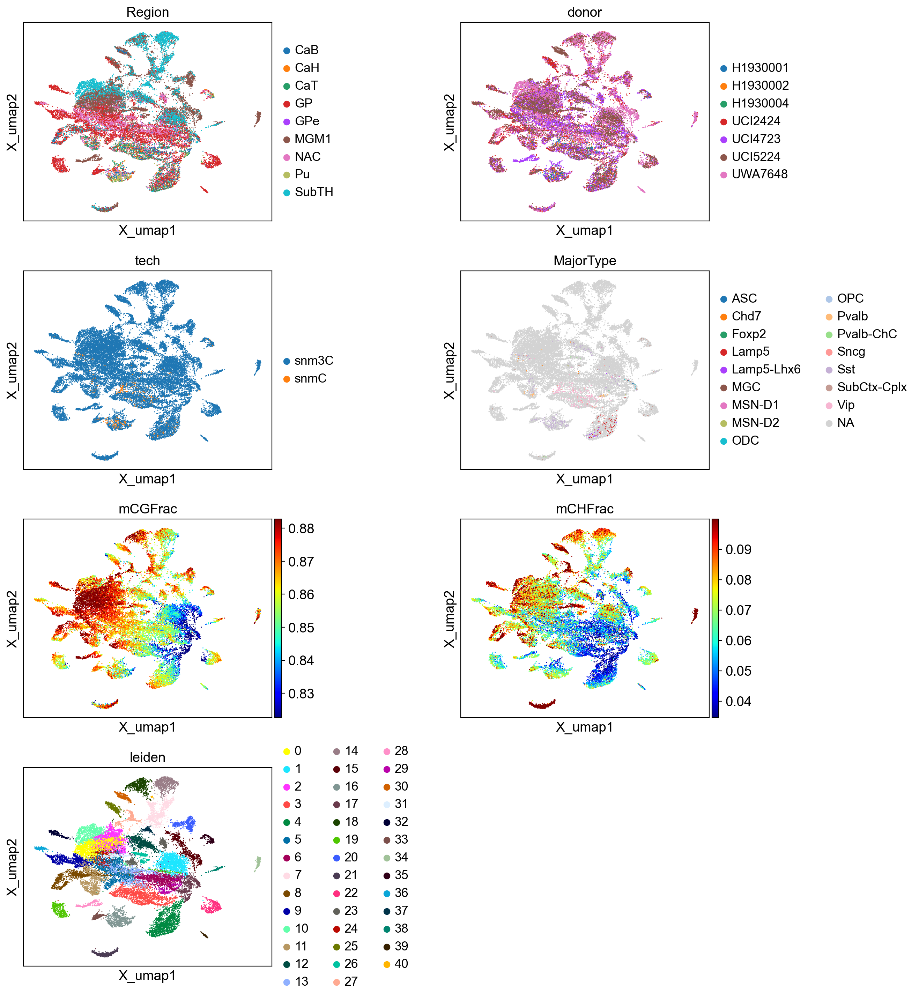

<Figure size 320x320 with 0 Axes>

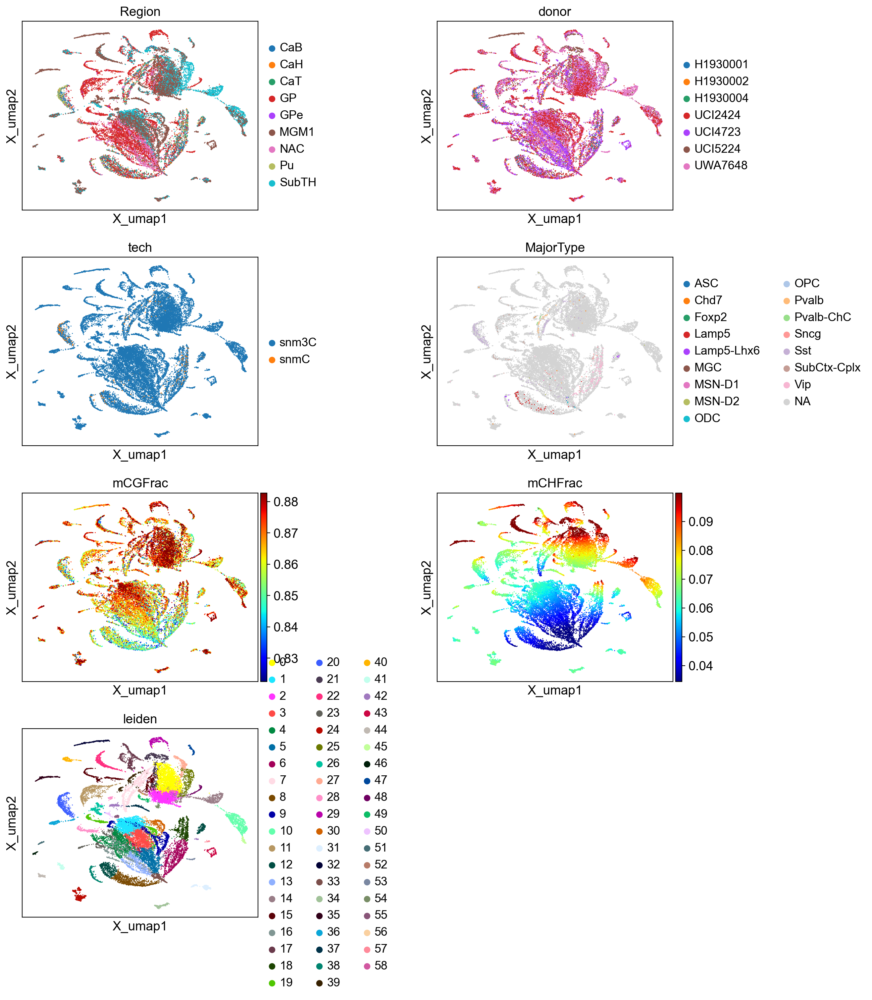

In [ ]:
for embedding in ['tsne','umap']: #tsne_raw is tsne without batch correction (harmony)
    print(embedding)
    for key in madata.get_keys():
        if f"X_{embedding}" not in madata.madata[key].obsm:
            continue
        plt.figure()
        madata.plot(keys=[key],coord_base=embedding,obs_cols=obs_cols,wspace=0.6,ncols=2,cmap='jet',legend_loc='right margin')
        plt.savefig(f"{fig_basename}.{key}.summary.{embedding}.pdf",bbox_inches='tight',dpi=300)

## CEF (Cluster Enriched Features)

L2_Splatter.BG.100kb-CGN


Normalizing cell level fraction by alpha and beta (prior_mean)


Found 41 clusters to compute feature enrichment score
Computing enrichment score


Computing enrichment score FDR-corrected P values


Selected 4622 unique features
Using Cluster Enriched Features


Normalizing cell level fraction by alpha and beta (prior_mean)


(25409, 4622)
adding raw to adata of L2_Splatter.BG.100kb-CGN ..


2025-06-13 13:39:23.377 | INFO     | pym3c.adata:cef:1315 - Running sc.tl.pca..


min and max: 0.085726686 51.05043


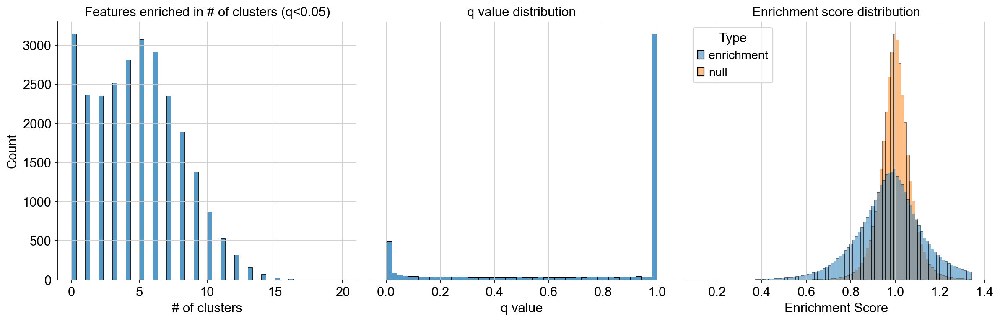

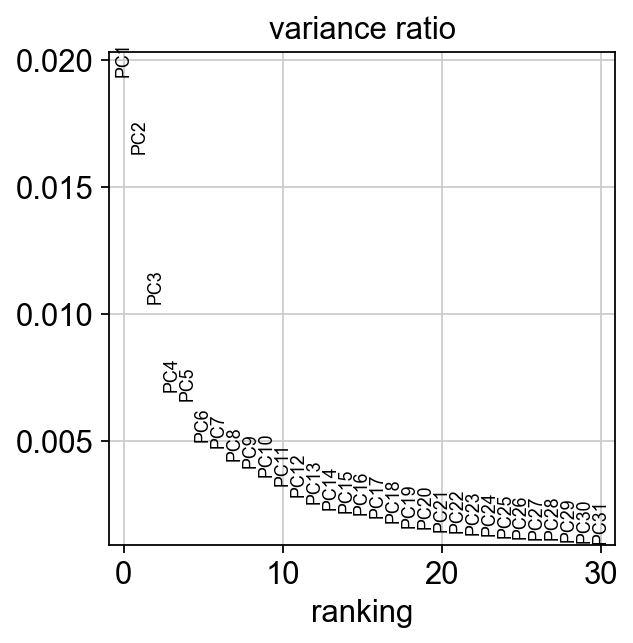

40 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca] from shape (25409, 100) to (25409, 40)


L2_Splatter.BG.100kb-CHN


Normalizing cell level fraction by alpha and beta (prior_mean)


Found 59 clusters to compute feature enrichment score
Computing enrichment score


Computing enrichment score FDR-corrected P values


Selected 4903 unique features
Using Cluster Enriched Features


Normalizing cell level fraction by alpha and beta (prior_mean)


(25409, 4903)
adding raw to adata of L2_Splatter.BG.100kb-CHN ..


2025-06-13 13:47:06.427 | INFO     | pym3c.adata:cef:1315 - Running sc.tl.pca..


min and max: 0.05087775 22.024563


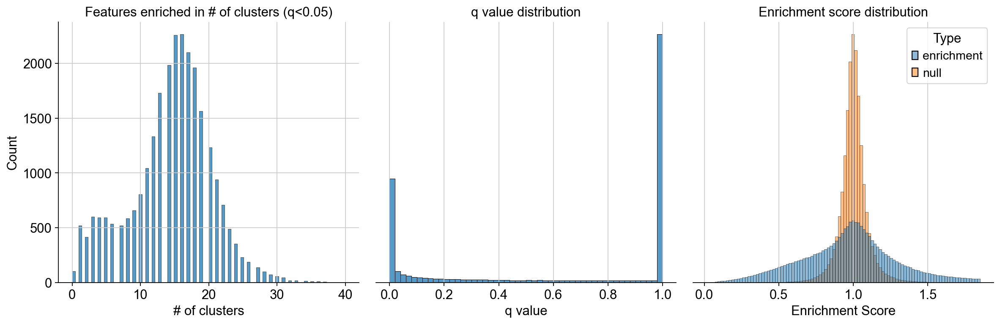

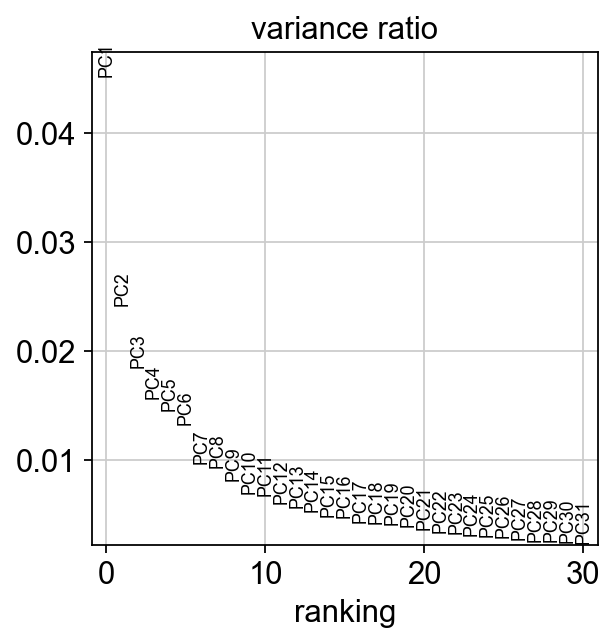

56 components passed P cutoff of 0.1.
Changing adata.obsm[X_pca] from shape (25409, 100) to (25409, 56)


In [8]:
# CEF
if feature_type == 'CEF':
    madata.cef(cef_downsample=cef_downsample,
               top_n_enriched_features=top_n_enriched_features,
               alpha=alpha,max_cell_prop = max_cell_prop,
               p_cutoff=p_cutoff,outdir=datadir,
               normalize_per_cell=normalize_per_cell,
               clip_norm_value=clip_norm_value,
               max_value=max_value,with_mean=with_mean)

## Before and after batch correction (harmony)

L2_Splatter.BG.100kb-CGN


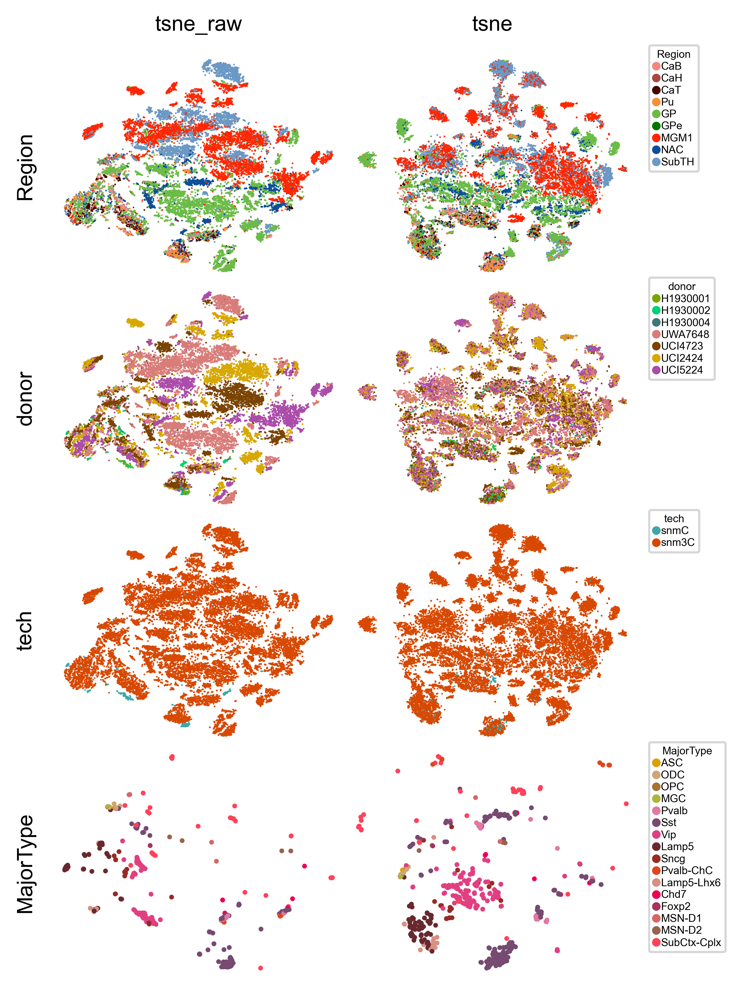

L2_Splatter.BG.100kb-CHN


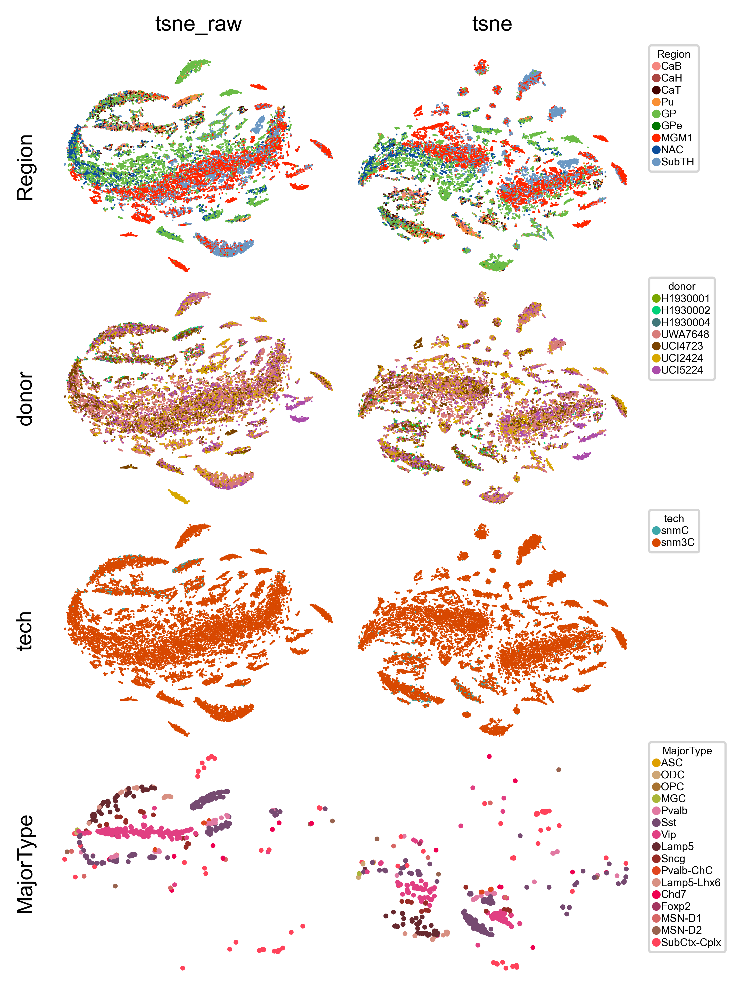

In [9]:
has_tsne_raw=True
for key in madata.get_keys():
        if "X_tsne_raw" not in madata.madata[key].obsm:
            has_tsne_raw=False
keys=list(pd.read_excel(os.path.expanduser(palette_path),sheet_name=None,index_col=0).keys())
selected_cols=[col for col in obs_cols if col in keys] #rows
if not batch_col is None and has_tsne_raw and len(selected_cols)  > 0:
    from pym3c.adata import plot_cluster
    basises=['tsne_raw','tsne'] # columns
    if len(selected_cols) > 0:
        nrows=len(selected_cols)
        ncols=len(basises)
        for key in madata.get_keys():
            print(key)
            adata=madata.madata[key]
            fig, axes = plt.subplots(nrows=nrows, ncols=ncols, 
                                     figsize=(ncols * 2.5, nrows * 2), dpi=300,
                                     constrained_layout=True,gridspec_kw=dict(wspace=-0.05,hspace=-0.05))
            if nrows==1:
                axes=axes.reshape(1,-1)
            for i,col in enumerate(selected_cols):
                if adata.obs[col].dropna().nunique()==0:
                    continue
                for j,basis in enumerate(basises):
                    ax=axes[i,j]
                    show_legend = True if (j + 1) == ncols else False
                    plot_cluster(adata_path=adata,coord_base=basis,cluster_col=col,
                         ax=ax,coding=False,palette_path=palette_path,
                         output=None,show_legend=show_legend,legend_fontsize=5,fontsize=6,
                        text_anno=None,show=False,axis_format=None)
                    if i==0:
                        ax.set_title(basis, fontsize=10)
                    if j==0:
                        ax.set_ylabel(col, fontsize=10)
                    # ax.axis('off')
            plt.tight_layout()
            plt.savefig(f"{fig_basename}.batch_correction.clustering.pdf", dpi=300, bbox_inches='tight')  #
            plt.show()

## Concatenate PCs
We further performed pre-clustering for each top PC set and selected the PCs that are enriched in pre-clusters following Ref (65). Finally, the selected PCs from both CG and CH methylation PCs were concatenated for further analysis. We used Harmony (66) on the selected 
PCs in order to eliminate individual differences. The Harmonized features were further fed into the consensus clustering procedures previously described (1).

In [10]:
adata=madata.run_embedding(
        batch_col=batch_col,
        leiden_resolution=leiden_resolution,
        normalize_per_cell=normalize_per_cell, 
        clip_norm_value=clip_norm_value,max_value=max_value,
        batch_correct_method=batch_correct_method, #seurat, scanorama, harmony, scvi
        n_jobs=n_jobs,
        categorical_covariate_keys=categorical_covariate_keys,
        continuous_covariate_keys=continuous_covariate_keys,
        n_latent=n_latent, n_layers=n_layers,
        gene_likelihood=gene_likelihood)

2025-06-13 13:47:30.297 | INFO     | pym3c.adata:concat_pca:1358 - Concat pcs..


2025-06-13 13:47:30,598 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Run clustering
Identified 13 unique batch:  ['BICAN-snm3C-UCI5224', 'BICAN-snm3C-UWA7648', 'BICAN-snm3C-UCI2424', 'HBA-snm3C-H1930002', 'BICAN-snm3C-UCI4723', 'BICAN-snm3C-H1930002', 'HBA-snmC-H1930001', 'BICAN-snm3C-H1930001', 'HBA-snmC-H1930002', 'HBA-snm3C-H1930004', 'HBA-snmC-H1930004', 'HBA-snm3C-H1930001', 'BICAN-snm3C-H1930004']


2025-06-13 13:47:37,381 - harmonypy - INFO - sklearn.KMeans initialization complete.


2025-06-13 13:47:37,513 - harmonypy - INFO - Iteration 1 of 50


2025-06-13 13:47:42,603 - harmonypy - INFO - Iteration 2 of 50


2025-06-13 13:47:47,671 - harmonypy - INFO - Iteration 3 of 50


2025-06-13 13:47:51,677 - harmonypy - INFO - Iteration 4 of 50


2025-06-13 13:47:56,732 - harmonypy - INFO - Iteration 5 of 50


2025-06-13 13:47:59,893 - harmonypy - INFO - Iteration 6 of 50


2025-06-13 13:48:02,642 - harmonypy - INFO - Iteration 7 of 50


2025-06-13 13:48:05,382 - harmonypy - INFO - Iteration 8 of 50


2025-06-13 13:48:10,239 - harmonypy - INFO - Iteration 9 of 50


2025-06-13 13:48:13,186 - harmonypy - INFO - Iteration 10 of 50


2025-06-13 13:48:15,941 - harmonypy - INFO - Iteration 11 of 50


2025-06-13 13:48:18,258 - harmonypy - INFO - Iteration 12 of 50


2025-06-13 13:48:20,587 - harmonypy - INFO - Iteration 13 of 50


2025-06-13 13:48:22,909 - harmonypy - INFO - Iteration 14 of 50


2025-06-13 13:48:25,239 - harmonypy - INFO - Converged after 14 iterations


X_pca_harmony
Running tsne


In [11]:
# print(madata.use_rep)
# hue = 'mCHFrac'
# if hue in adata.obs.columns:
#     fig, axes = plot_decomp_scatters(
#         adata,n_components=adata.obsm[madata.use_rep].shape[1],
#         hue=hue,hue_quantile=(0.25, 0.75),nrows=5,ncols=5)

In [12]:
# hue = 'mCGFrac'
# if hue in adata.obs.columns:
#     fig, axes = plot_decomp_scatters(
#         adata,n_components=adata.obsm[madata.use_rep].shape[1],
#         hue=hue,hue_quantile=(0.25, 0.75),nrows=5,ncols=5)

## Visualization

In [ ]:
if not batch_col is None:
    if isinstance(batch_col,str):
        batch_col=[batch_col]
    assert isinstance(batch_col,list)
    for hue in batch_col:
        for embedding in ['tsne','umap']:
            if f"X_{embedding}" not in adata.obsm:
                continue
            fig, ax = plt.subplots(figsize=(4, 4), dpi=250)
            _ = categorical_scatter(data=adata,
                                    ax=ax,hue=hue,
                                    coord_base=embedding,
                                    #palette='tab20',
                                    # text_anno=hue,
                                    show_legend=True)
            # plt.savefig(f"{fig_basename}.batch.{embedding}.pdf",bbox_inches='tight',dpi=300)
            plt.show()

In [ ]:
for embedding in ['tsne','umap']:
    if f"X_{embedding}" not in adata.obsm:
        continue
    print(embedding)
    fig, ax = plt.subplots(figsize=(4, 4), dpi=250)
    categorical_scatter(data=adata,
                        ax=ax,coord_base=embedding,hue='leiden',
                        show_legend=True,max_points=None)
    plt.savefig(f"{fig_basename}.concatenated_pcs_leiden.{embedding}.pdf",bbox_inches='tight',dpi=300)
    plt.show()

In [ ]:
for col in obs_cols:
    if f"{col}_colors" in adata.uns:
        del adata.uns[f"{col}_colors"] #leiden_colors category values is longer than real leiden
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (100)}):
    for embedding in ['tsne','umap']:
        if f"X_{embedding}" not in adata.obsm:
            continue
        # plt.figure()
        sc.pl.embedding(adata,basis=f"X_{embedding}",wspace=0.6,color=obs_cols,
                   ncols=2,vmin='p5',vmax='p95',cmap='jet',show=False) #use_raw=False,vcenter='p50',
        # plt.savefig(f"{fig_basename}.concatenated.summary.{coord_base}.pdf",bbox_inches='tight',dpi=300)

In [16]:
adata.strings_to_categoricals()
adata.write_h5ad(f"{data_basename}.concatenated_pcs.adata.h5ad") #X is mch_adata.X

In [17]:
# import anndata
# adata=anndata.read_h5ad(f"{data_basename}.concatenated_pcs.adata.h5ad")
# adata